
[Holzapfel and Stylianou](https://www.ics.forth.gr/netlab/data/J13.pdf)


In [1]:
from __future__ import print_function

In [2]:
import librosa
import numpy as np
import scipy
import matplotlib.pyplot as plt
%matplotlib inline
from IPython.display import Audio

Vendor:  Continuum Analytics, Inc.
Package: mkl
Message: trial mode expires in 29 days


In [109]:
y, sr = librosa.load('audio/BFJazz_-_Stargazer_from_Texas.mp3')

In [110]:
# aCompute a log-CQT for vis purpose
C = librosa.logamplitude(librosa.cqt(y=y, sr=sr, bins_per_octave=12*3, n_bins=7*12*3, real=False)**2, ref_power=np.max)

In [111]:
# Get the tempogram
tgram = librosa.feature.tempogram(y=y, sr=sr)

In [112]:
Audio(data=y, rate=sr)

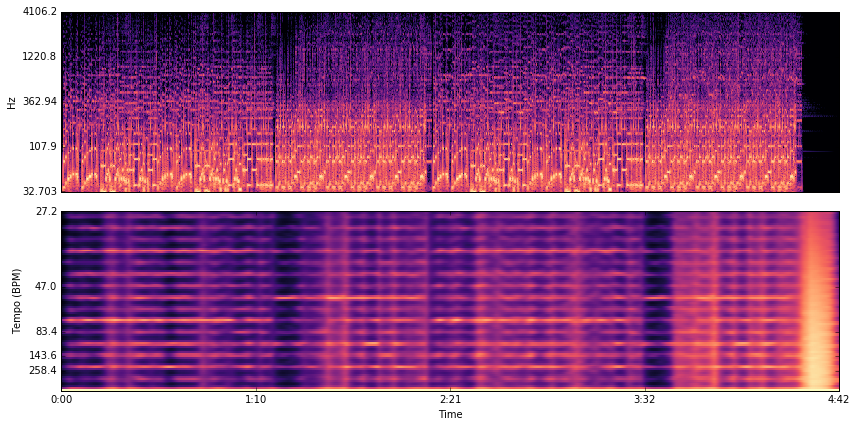

In [113]:
plt.figure(figsize=(12, 6))

plt.subplot(2,1,1)
librosa.display.specshow(C, y_axis='cqt_hz', bins_per_octave=12*3)

plt.subplot(2,1,2)
librosa.display.specshow(tgram[:96], y_axis='tempo', x_axis='time')

plt.tight_layout()

The above figure reveals that the track alternates between sections in 3/4 and 4/4.

In [114]:
tst = librosa.fmt(tgram, axis=0, n_fmt=256)

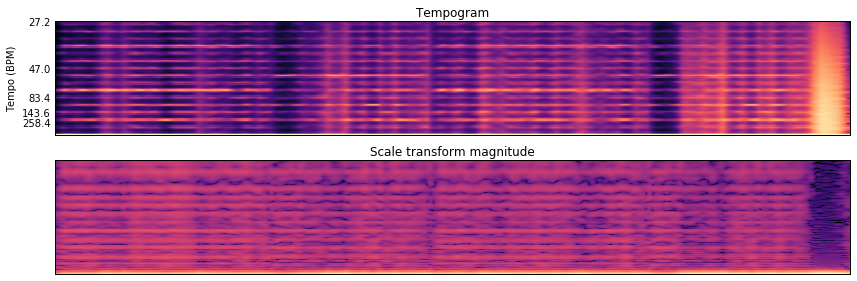

In [115]:
plt.figure(figsize=(12, 4))
plt.subplot(2,1,1)
librosa.display.specshow(tgram[:96], y_axis='tempo')
plt.title('Tempogram')
plt.subplot(2,1,2)
librosa.display.specshow(librosa.logamplitude(tst**2, ref_power=np.max))
plt.title('Scale transform magnitude')
plt.tight_layout()

In [116]:
# Let's beat-synchronize to reduce dimensionality
tempo, beats = librosa.beat.beat_track(y=y, sr=sr, trim=False)

In [117]:
tgram_sync = librosa.util.sync(tgram, beats, aggregate=np.median)
tst_sync = librosa.util.sync(np.abs(tst), beats, aggregate=np.mean)

In [118]:
# And plot a distance matrix for each feature
Rtgram = scipy.spatial.distance.cdist(tgram_sync.T, tgram_sync.T, metric='euclidean')
Rtst = scipy.spatial.distance.cdist(tst_sync.T, tst_sync.T, metric='seuclidean')

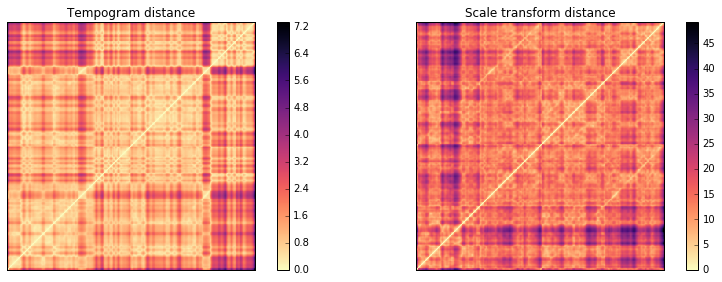

In [119]:
plt.figure(figsize=(12, 4))
plt.subplot(1,2,1)
librosa.display.specshow(Rtgram, cmap='magma_r', aspect='equal')
plt.title('Tempogram distance')
plt.colorbar()

plt.subplot(1,2,2)
librosa.display.specshow(Rtst, cmap='magma_r', aspect='equal')
plt.title('Scale transform distance')
plt.colorbar()
plt.tight_layout()

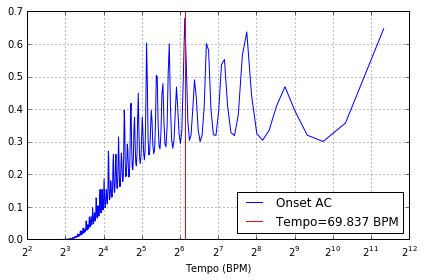

In [120]:
# Let's plot the "average" onset autocorrelation on log-lag axis
# We use the median to suppress outliers / breaks
# We skip over the lag=0 point, since it corresponds to infinite tempo

plt.figure(figsize=(6, 4))
plt.semilogx(librosa.tempo_frequencies(len(tgram))[1:], np.median(tgram[1:], axis=1),
             label='Onset AC', basex=2)

plt.axvline(tempo, color='r', label='Tempo={:.3f} BPM'.format(tempo))
plt.xlabel('Tempo (BPM)')


plt.grid()
plt.legend(loc='best')
plt.tight_layout()